In [5]:
pip install pandas

  Using cached pytz-2025.2-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 45.7 MB/s  0:00:006m0:00:01
Using cached pytz-2025.2-py2.py3-none-any.whl (509 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [pandas]2m2/3 [pandas]
Note: you may need to restart the kernel to use updated packages.



Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /localhome/morne/yolo/scripts/bus.jpg: 640x480 4 persons, 1 bus, 3.6ms
Speed: 0.9ms preprocess, 3.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)


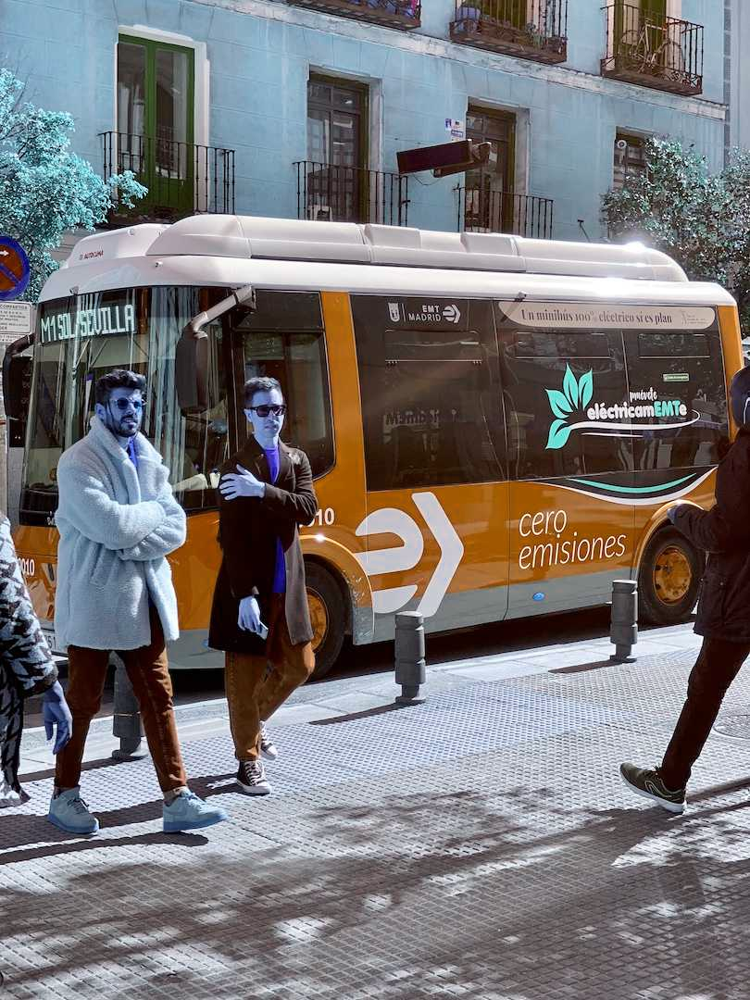

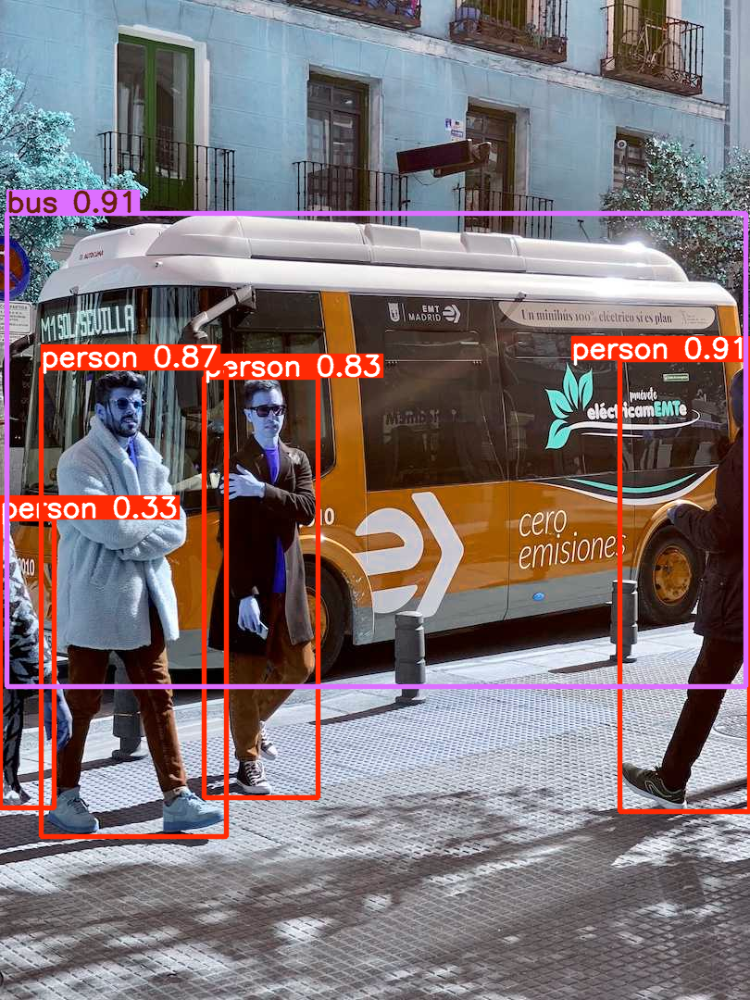

In [6]:
# YOLO12 inference in Jupyter Notebook
from ultralytics import YOLO
from IPython.display import display
from PIL import Image

# 1️⃣ Load the YOLO12 nano model
model = YOLO("yolo12n.pt")

# 2️⃣ Run inference on an image
results = model("https://ultralytics.com/images/bus.jpg")  # you can replace with a local file

# 3️⃣ Get the first result (only one image here)
r = results[0]

# 4️⃣ Show image inline (Jupyter)
im = Image.fromarray(r.orig_img)
display(im)

# 5️⃣ Access detected boxes, scores, and class names
boxes = r.boxes.xyxy.cpu().numpy()      # [x1, y1, x2, y2]
scores = r.boxes.conf.cpu().numpy()     # confidence
class_ids = r.boxes.cls.cpu().numpy()   # class index
class_names = [r.names[int(c)] for c in class_ids]

# 6️⃣ Print nicely
import pandas as pd

df = pd.DataFrame({
    "class": class_names,
    "score": scores,
    "x1": boxes[:,0],
    "y1": boxes[:,1],
    "x2": boxes[:,2],
    "y2": boxes[:,3]
})

# Draw predictions on image
r.plot()  # returns a numpy array with boxes drawn

# Show it inline
display(Image.fromarray(r.plot()))




Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /localhome/morne/yolo/scripts/bus.jpg: 640x480 4 persons, 1 bus, 3.5ms
Speed: 0.8ms preprocess, 3.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 480)


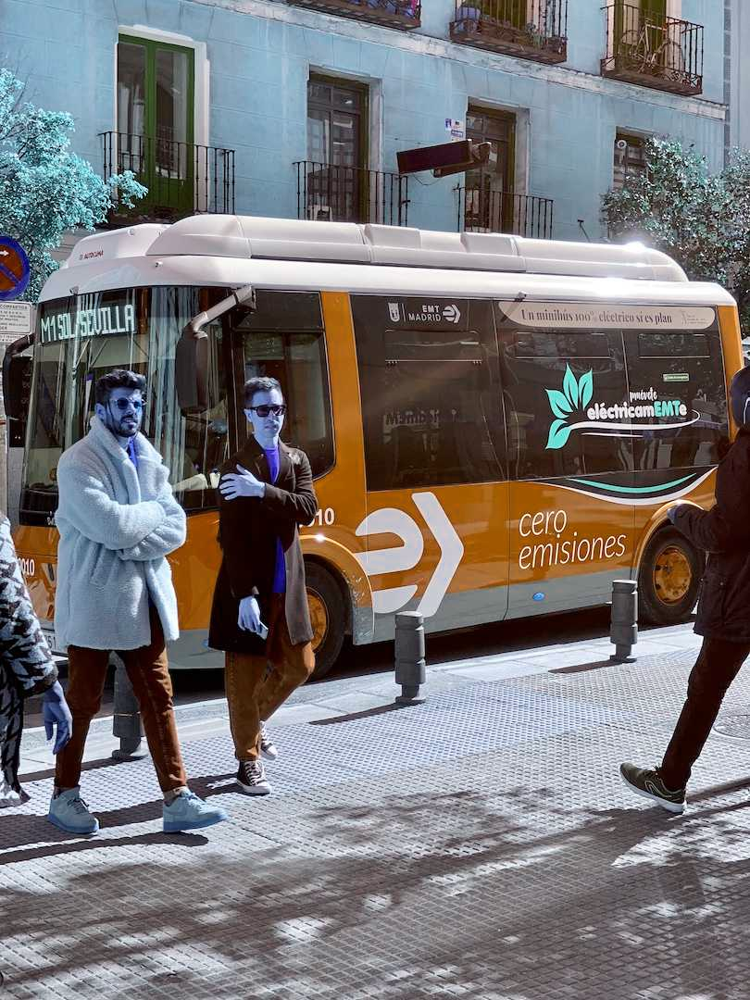

No masks detected.


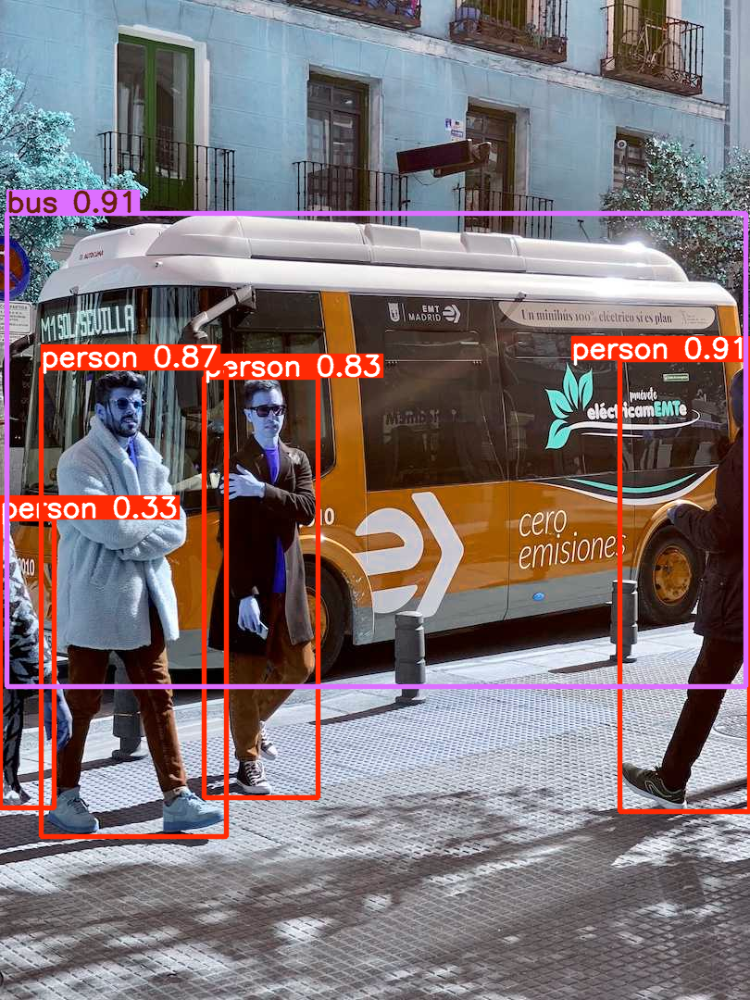

In [9]:
# YOLO12 segmentation in Jupyter Notebook
from ultralytics import YOLO
from PIL import Image
from IPython.display import display
import pandas as pd

# 1️⃣ Load a segmentation-capable YOLO12 model
# Use the "-seg" weights if you have them (YOLO12n-seg.pt), otherwise standard weights support segmentation as well
model = YOLO("yolo12n.pt")  # detection weights
results = model("https://ultralytics.com/images/bus.jpg", task="segment")


# 3️⃣ Get first result
r = results[0]

# 4️⃣ Show the original image inline
display(Image.fromarray(r.orig_img))

# 5️⃣ Access segmentation masks
# r.masks is a Segmentation object (can convert to polygons or binary masks)
if r.masks is not None:
    print("Masks available!")
    # Get masks as a boolean numpy array [num_masks, height, width]
    masks = r.masks.data.cpu().numpy()
    print("Masks shape:", masks.shape)
else:
    print("No masks detected.")

# 6️⃣ Access boxes, class IDs, and confidence (same as detection)
boxes = r.boxes.xyxy.cpu().numpy()
scores = r.boxes.conf.cpu().numpy()
class_ids = r.boxes.cls.cpu().numpy()
class_names = [r.names[int(c)] for c in class_ids]

# 7️⃣ Create a table of objects
df = pd.DataFrame({
    "class": class_names,
    "score": scores,
    "x1": boxes[:,0],
    "y1": boxes[:,1],
    "x2": boxes[:,2],
    "y2": boxes[:,3]
})

# r.plot() automatically draws boxes + masks
segmented_image = r.plot()
display(Image.fromarray(segmented_image))



In [13]:
from ultralytics import YOLO

# Create a new segmentation model from YAML
model = YOLO("yolo11n-seg.yaml")

# Train on your segmentation dataset
results = model.train(data="coco8-seg.yaml", epochs=100, imgsz=640)


Ultralytics 8.3.246 🚀 Python-3.10.12 torch-2.9.1+cu128 CUDA:0 (NVIDIA GeForce RTX 4090, 24111MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=coco8-seg.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True

In [14]:
# Save the trained model to a custom path
model.save("yolo11n-seg-trained.pt")



image 1/1 /localhome/morne/yolo/data/20251223_190746(0)(1).jpg: 640x480 1 dog, 1 cow, 2.6ms
Speed: 0.8ms preprocess, 2.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)


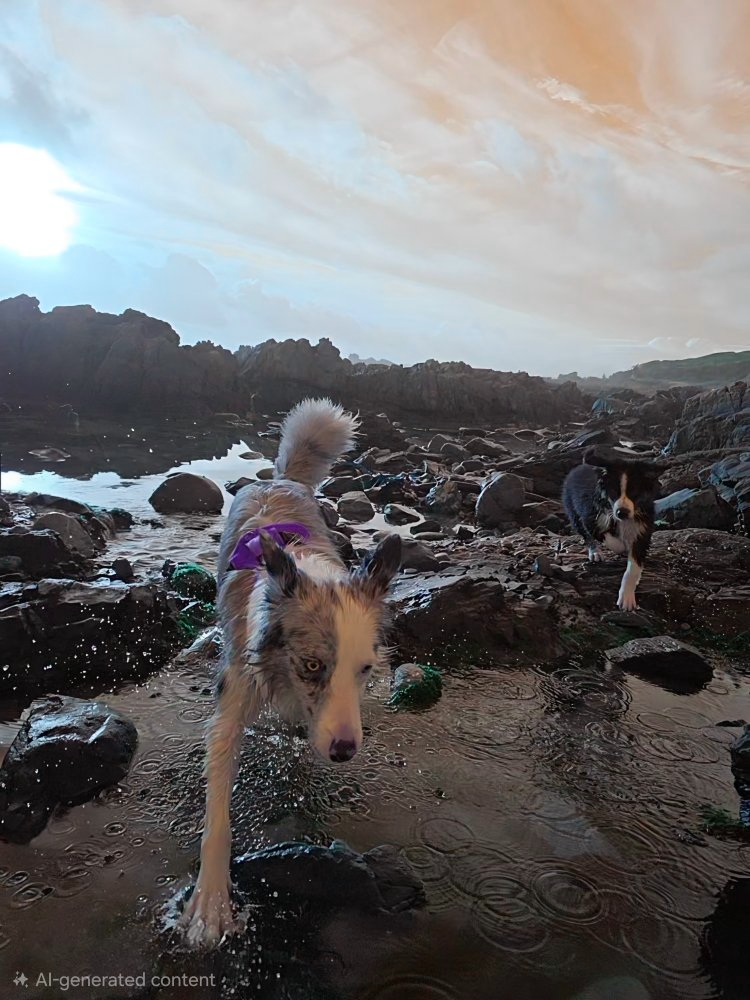

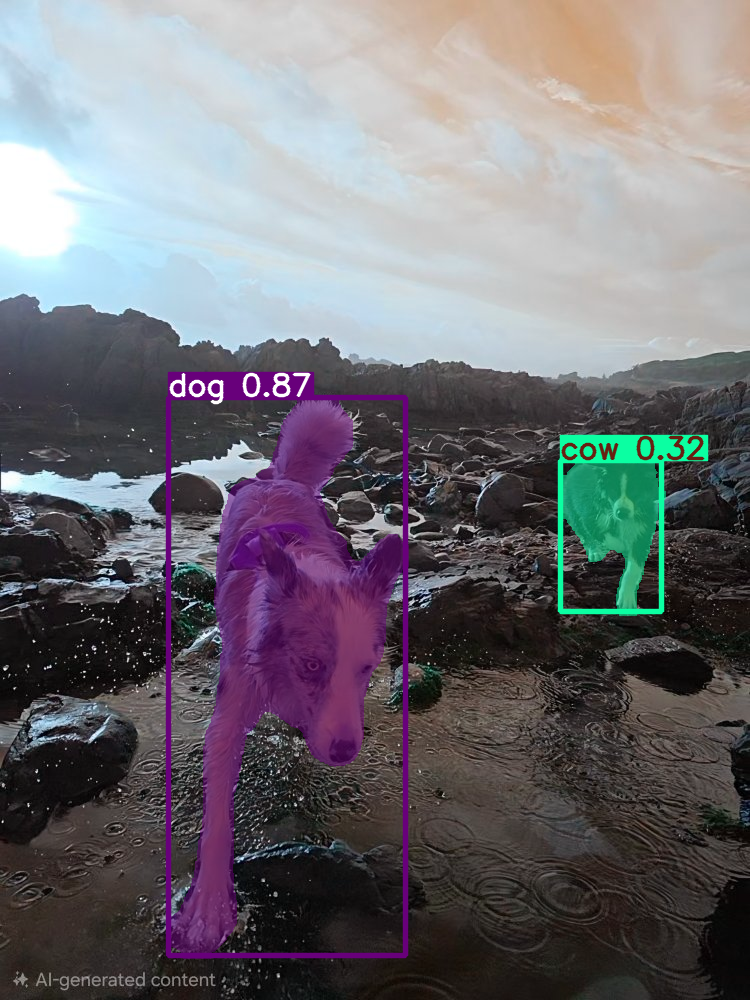

In [21]:
from ultralytics import YOLO
from PIL import Image
from IPython.display import display

model = YOLO("yolo11n-seg.pt")
results = model("/localhome/morne/yolo/data/20251223_190746(0)(1).jpg", task="segment")
r = results[0]

display(Image.fromarray(r.orig_img))
if r.masks is not None:
    display(Image.fromarray(r.plot()))


In [ ]:
# -----------------------------
# YOLO11 Segmentation on Video
# -----------------------------
from ultralytics import YOLO
from IPython.display import Video
import os

# 1️⃣ Load a pretrained YOLO11 segmentation model
model = YOLO("yolo11n-seg.pt")  # pretrained model with -seg

# 2️⃣ Define video path (input)
input_video = "../data/20251223_190428.mp4"
if not os.path.exists(input_video):
    raise FileNotFoundError(f"Input video not found at {input_video}")

# 3️⃣ Run segmentation on the video
# YOLO will automatically save processed video to runs/predict/exp/
results = model(input_video, task="segment")

# 4️⃣ Locate the saved processed video
exp_dir = "./runs/predict/exp"  # default folder for YOLO outputs
saved_files = os.listdir(exp_dir)
video_files = [f for f in saved_files if f.endswith(".mp4")]
if not video_files:
    raise FileNotFoundError("No processed video found in exp folder.")

# Take the first processed video (usually the one you just ran)
output_video = os.path.join(exp_dir, video_files[0])
print("Processed video saved at:", output_video)

# 5️⃣ Display video inline in Jupyter Notebook
Video(output_video, embed=True)



WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 2 sheeps, 3.3ms
video 1/1 (frame 2/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 2 sheeps, 3.0ms
video 1/1 (frame 3/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.9ms
video 1/1 (frame 4/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.8ms
video 1/1 (frame 5/97) /localhome/mo

video 1/1 (frame 7/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.8ms
video 1/1 (frame 8/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.9ms
video 1/1 (frame 9/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.8ms
video 1/1 (frame 10/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.8ms
video 1/1 (frame 11/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.8ms
video 1/1 (frame 12/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.8ms
video 1/1 (frame 13/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 (no detections), 2.8ms
video 1/1 (frame 14/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 bear, 2.7ms
video 1/1 (frame 15/97) /localhome/morne/yolo/scripts/../data/20251223_190428.mp4: 640x480 1 sheep, 2.9ms
video 1/1 (frame 16/97) /localhome/morne/y

FileNotFoundError: [Errno 2] No such file or directory: '/localhome/morne/yolo/scripts/runs/predict'